# HappyDB: A Crowdsourced Exploration of Joy in Text

## Chencan Zou                                                                  09/20/2023

## 1. Introduction

Understanding the essence of human happiness is a fundamental pursuit, one that has the potential to enhance the quality of our lives and foster positive experiences. In this pursuit, we introduce HappyDB, a remarkable and extensive collection of 100,000 joyful moments, thoughtfully crowdsourced from individuals and made publicly accessible. Our overarching aim is to leverage the power of Natural Language Processing (NLP) technology to gain profound insights into how people express and share their happiness through text. Beyond this, we aspire to uncover the underlying events and scenarios that lead to happiness on a substantial scale.

The primary goal of HappyDB extends beyond the mere compilation of cheerful anecdotes. We are deeply committed to the development of NLP systems capable of not only comprehending how people convey their happiness but also of providing valuable, sustainable actions that individuals can take to enhance their overall well-being in real-life moments. In essence, HappyDB serves as a unique and invaluable resource at the exciting intersection of NLP and the realm of positive psychology.

In this report, we will delve into the intricacies of HappyDB and develop a model to classify human happiness into existing categories (bonding, leisure, affection, enjoying the moment, achievement, nature, and exercise). Simultaneously, we will uncover intriguing insights that our data may suggest.

## 2. Dataset and Methods

### 2.1 Data Collection

The collection of these happy moments took place on Amazon Mechanical Turk (MTurk) over a span of three months. Each MTurk worker was tasked with recalling and describing three specific events or experiences that had made them happy. Importantly, these moments were to be from their recent past, within either the previous 24 hours or the past three months. Workers were instructed to articulate these happy moments in complete sentences.

Examples of what was not sought in this collection included events from the distant past and partial sentences. The focus was on capturing immediate, authentic moments of happiness.

### 2.2 Dataset Introduction

cleaned_hm.csv: Contains cleaned-up happy moments along with additional information.
demographic.csv: Contains demographic information about the MTurk workers who contributed to the collection.

### 2.3 Method
1. Data Cleaning:
Data cleaning is a critical step in preparing the HappyDB dataset for analysis. It involves several sub-tasks:
Text Cleaning: Remove any special characters, punctuation, and non-alphanumeric characters from the text.
Lowercasing: Convert all text to lowercase to ensure consistency in word representation.
Stopword Removal: Eliminate common stop words (e.g., "the," "and," "is") to focus on meaningful content.
Handling Missing Data: Address any missing or incomplete entries in the dataset.
2. Data Transformation:
Data transformation involves converting the cleaned data into a format suitable for analysis and feature extraction:
Feature Engineering: Create meaningful features from the text data, such as word count, sentence length, sentiment scores, or any domain-specific features.
Text Tokenization: Split text into individual words or tokens, which serve as the fundamental units for analysis.
Vectorization: Convert text data into numerical vectors using techniques like word embeddings(word2vec).
3. Data Visualization:
Word Cloud: Generate word clouds to visualize the most frequent words in the dataset, providing an overview of the topics or themes related to happiness.
4. Word Representation (Word Embeddings):
Word embeddings Using Word2Vec to represent words in a continuous vector space. This step involves:
Word Embedding Training: Train a Word2Vec model on the preprocessed text data to learn word representations.
Word Vector Visualization: Visualize word vectors to explore semantic relationships between words (e.g., finding words similar in meaning).
5. Modeling:
For NLP tasks on HappyDB, machine learning models can be applied:
Random Forest: Implement a Random Forest classifier for tasks like sentiment analysis or topic classification. Random Forest is an ensemble learning method that can handle text data effectively.
XGBoost: Utilize XGBoost, an optimized gradient boosting algorithm, for tasks like predicting happiness levels or categorizing happy moments into predefined categories.
Each of these methods plays a crucial role in processing the HappyDB dataset, from cleaning and transforming the data to extracting meaningful features and applying machine learning models for analysis and insights. The choice of specific methods may vary depending on the research objectives and the nature of the NLP tasks being performed.

## Let's Begin

### Import packages

In [24]:
import pandas as pd
import re
from sklearn.metrics import accuracy_score
from gensim.models import Word2Vec
import numpy as np
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
import nltk 
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\36187\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Import Data

In [9]:
folder = 'https://raw.githubusercontent.com/megagonlabs/HappyDB/master/happydb/data/'
df_happy = pd.read_csv(folder+'cleaned_hm.csv', sep = ",",on_bad_lines='skip')
df_demo =  pd.read_csv(folder+'demographic.csv', sep = ",",on_bad_lines='skip')

### Data Overview

In [10]:
df_happy.head(5)

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection


In [11]:
df_demo.head(5)

,wid,age,country,gender,marital,parenthood
0,1,37.0,USA,m,married,y
1,2,29.0,IND,m,married,y
2,3,25,IND,m,single,n
3,4,32,USA,m,married,y
4,5,29,USA,m,married,y


#### Overall Wordcloud

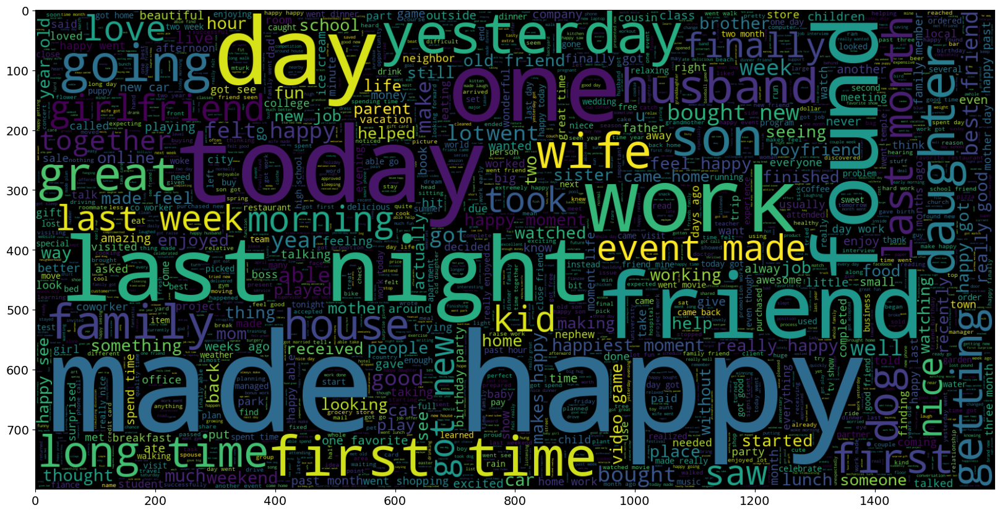

In [26]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_happy.cleaned_hm))
plt.imshow(wc , interpolation = 'bilinear')

Is something weired in this word cloud? I see friend, work,daughter,son,family,husband,wife,girl friend,dog...

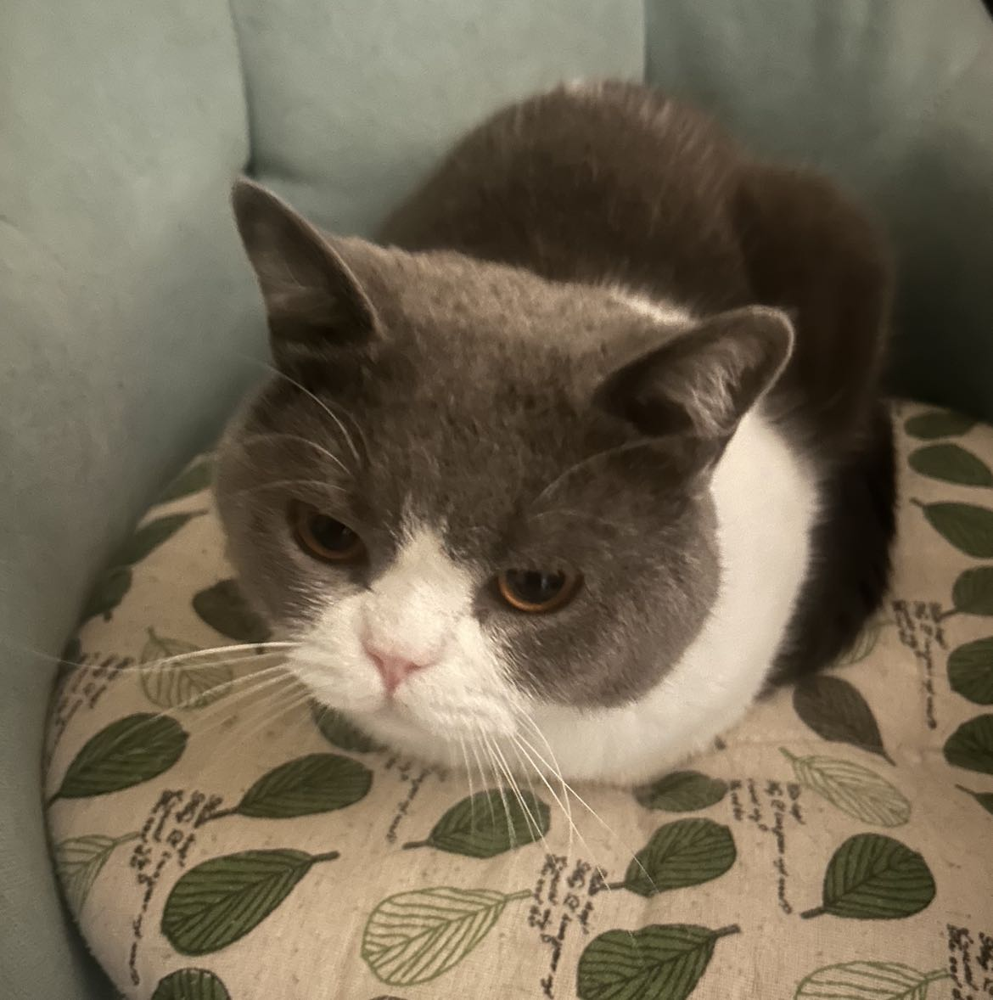

WHERE IS CAT? As a cat lover, I want to find the reason why cat is so small in the word cloud...

### Data Cleaning

In [16]:
#Remove any special characters, punctuation, and non-alphanumeric characters from the text&change into lower case
stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')
text_cleaning_re = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"
def preprocess(text, stem=False):
  text = re.sub(text_cleaning_re, ' ', str(text).lower()).strip()
  tokens = []
  for token in text.split():
    if token not in stop_words:
      if stem:
        tokens.append(stemmer.stem(token))
      else:
        tokens.append(token)
  return " ".join(tokens)
df_happy.cleaned_hm = df_happy.cleaned_hm.apply(lambda x: preprocess(x))
print(df_happy.shape) ##(100535, 9)##

In [17]:
# Remove NA and unmodified data
df = df_happy[~pd.isnull(df_happy["ground_truth_category"])]
print(df.shape)  ##(14125, 9)##
df = df[df["modified"] == True]
print(df.shape) ##(13768, 9)

(100535, 9)
(14125, 9)
(13768, 9)


### Data Transformation

In [28]:
###merge demographic###
df = pd.merge(df, df_demo, left_on="wid", right_on="wid")

After merging the data, I made the decision to apply a demographic filter to investigate whether the significance of "cat" varies among specific groups of people.

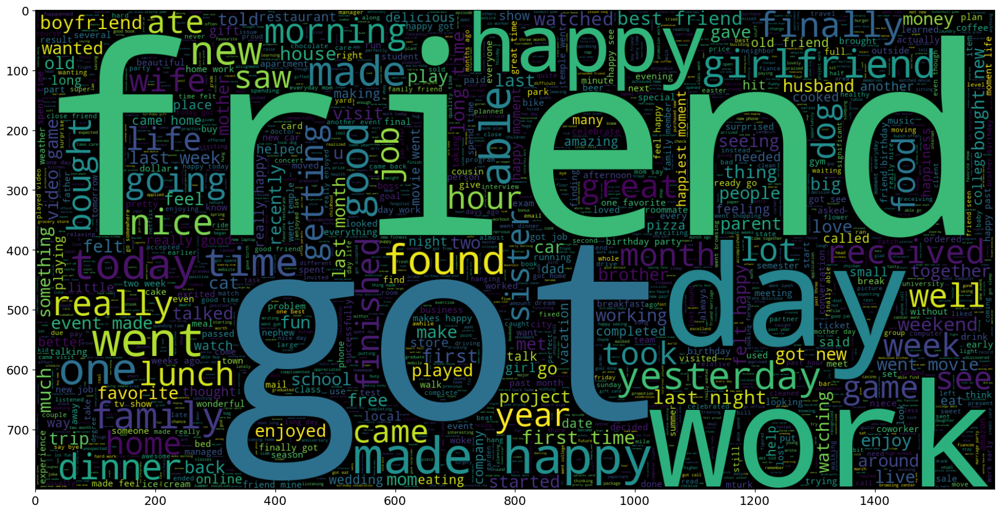

In [34]:
plt.figure(figsize = (20,20)) 
wc_female = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.parenthood == 'n'].cleaned_hm))
plt.imshow(wc_female , interpolation = 'bilinear')

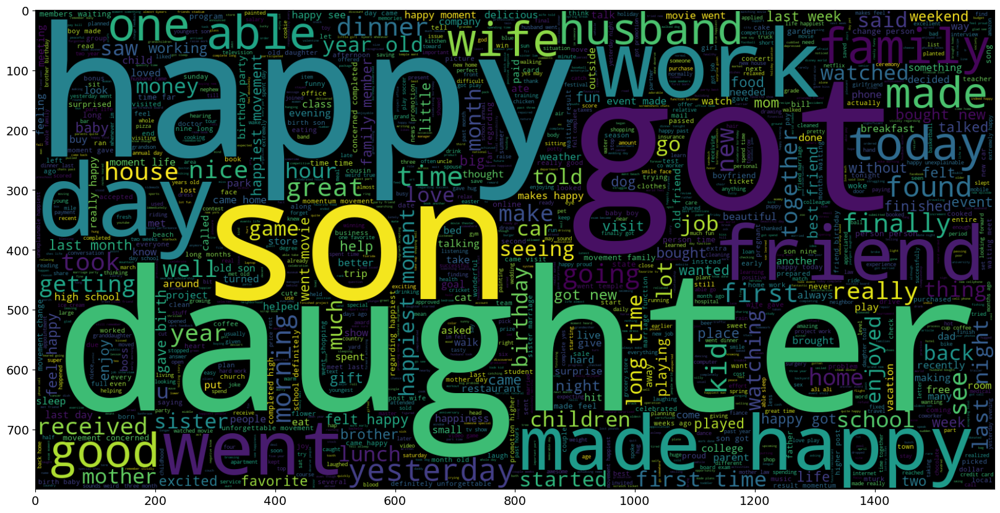

In [36]:
plt.figure(figsize = (20,20)) 
wc_female = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.parenthood == 'y'].cleaned_hm))
plt.imshow(wc_female , interpolation = 'bilinear')

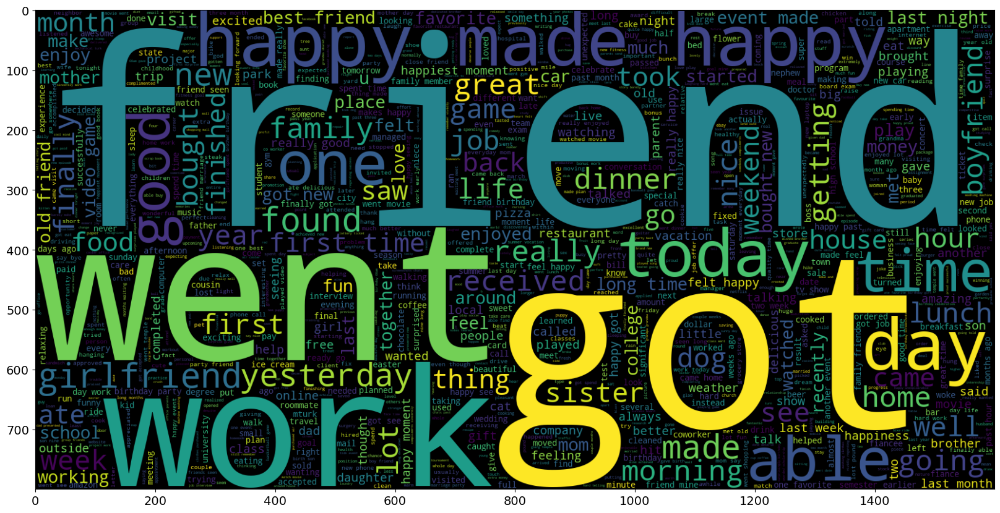

In [35]:
plt.figure(figsize = (20,20)) 
wc_female = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.marital == 'single'].cleaned_hm))
plt.imshow(wc_female , interpolation = 'bilinear')

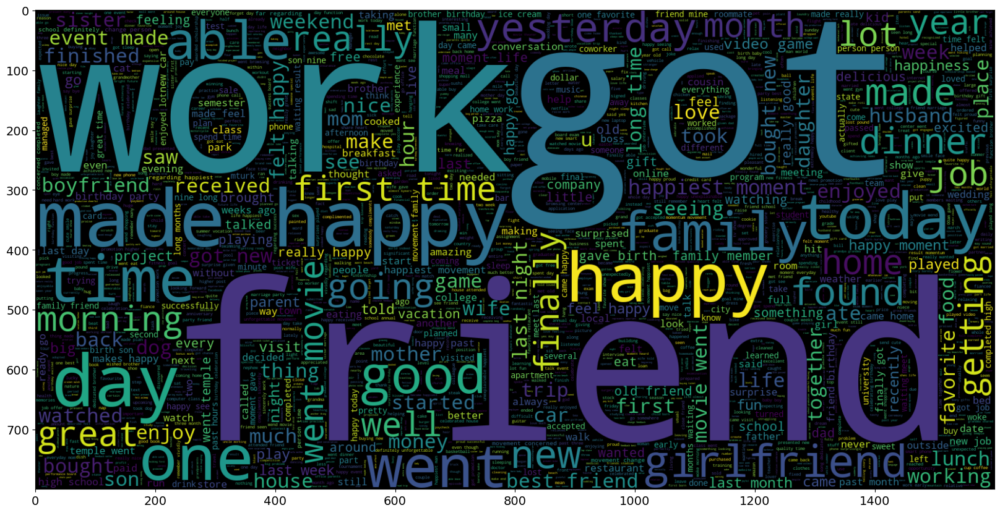

In [37]:
plt.figure(figsize = (20,20)) 
wc_female = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.age <= '30'].cleaned_hm))
plt.imshow(wc_female , interpolation = 'bilinear')

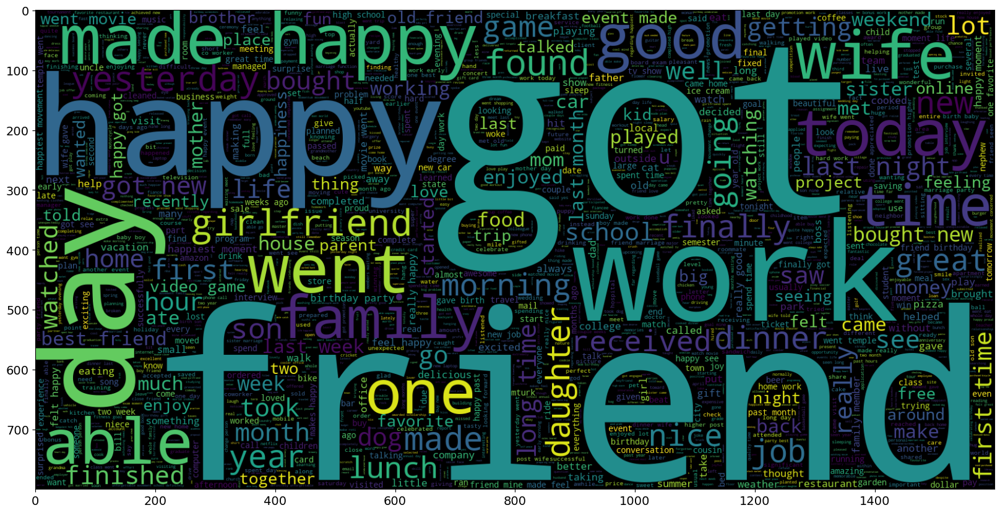

In [38]:
plt.figure(figsize = (20,20)) 
wc_female = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.gender == 'm'].cleaned_hm))
plt.imshow(wc_female , interpolation = 'bilinear')

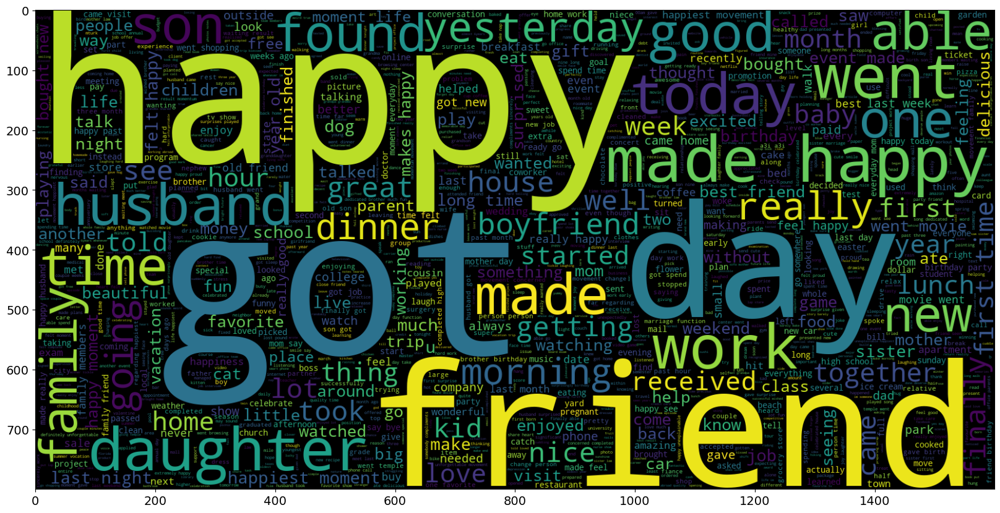

In [39]:
plt.figure(figsize = (20,20)) 
wc_female = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.gender == 'f'].cleaned_hm))
plt.imshow(wc_female , interpolation = 'bilinear')

It seems that cats are not an important indicator to certain group of people...
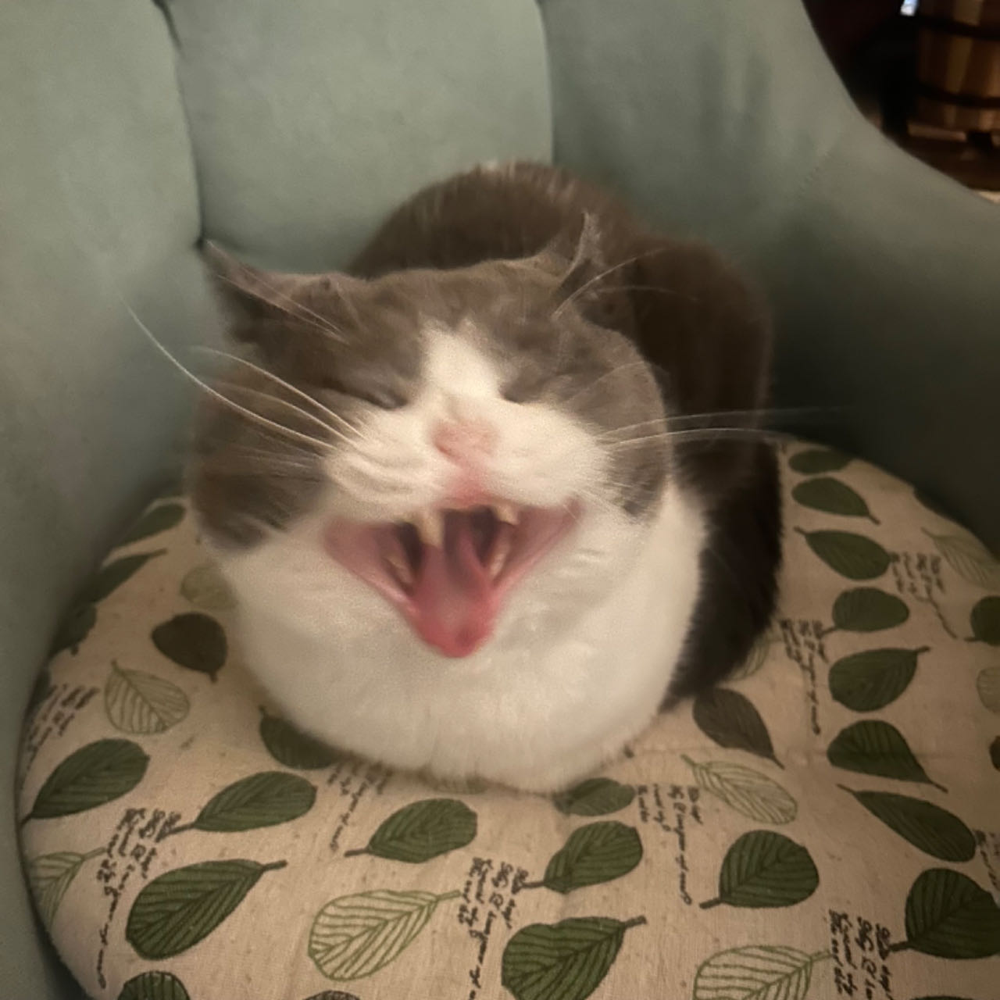

In [31]:
###preprocess list##
textList = df["cleaned_hm"].to_list()

textList = [t.split(" ") for t in textList]

model = Word2Vec(textList, window=5, min_count=1, workers=4)

print(model.wv["cat"])

model.wv.most_similar("girl", topn = 10)

[-0.2048846   0.40784317  0.13079385  0.03248175 -0.06100328 -0.7986343
  0.05948756  1.0151246  -0.2632854   0.01001329 -0.39679718 -0.7672
 -0.34146565  0.13373111  0.04004161 -0.40474364  0.05955179 -0.6465308
  0.00882218 -0.9872065   0.23158705  0.37696347  0.4253104  -0.12874092
 -0.12866527  0.15324691 -0.42207804 -0.19634873 -0.3609199   0.08270256
  0.5666493   0.07640684  0.11834768 -0.15832698 -0.32828557  0.6164346
 -0.20483156 -0.52012    -0.42682463 -0.9138655   0.23792702 -0.9023756
 -0.39483956 -0.00644395  0.38630462 -0.39614645 -0.36626583 -0.03694561
  0.12274038  0.31947738  0.19181688 -0.56777847 -0.10401095 -0.26175013
 -0.19892591  0.3212209   0.32166407 -0.0517626  -0.53260696  0.17721918
  0.12563665 -0.0645779  -0.00421855 -0.14390941 -0.4501021   0.43585983
  0.32037216  0.60695404 -0.7882826   0.90228814 -0.55471104  0.18058273
  0.48514372 -0.15941343  0.43029374  0.42140636  0.18479769 -0.15548009
 -0.53373295  0.3032361  -0.47742066 -0.22561227 -0.432434 

[('little', 0.9993945956230164),
 ('feeling', 0.9993829727172852),
 ('loved', 0.9993452429771423),
 ('beautiful', 0.999343991279602),
 ('amazing', 0.9993290305137634),
 ('huge', 0.9992872476577759),
 ('giving', 0.9992858171463013),
 ('everyone', 0.9992780089378357),
 ('cute', 0.9992707371711731),
 ('times', 0.9992607831954956)]

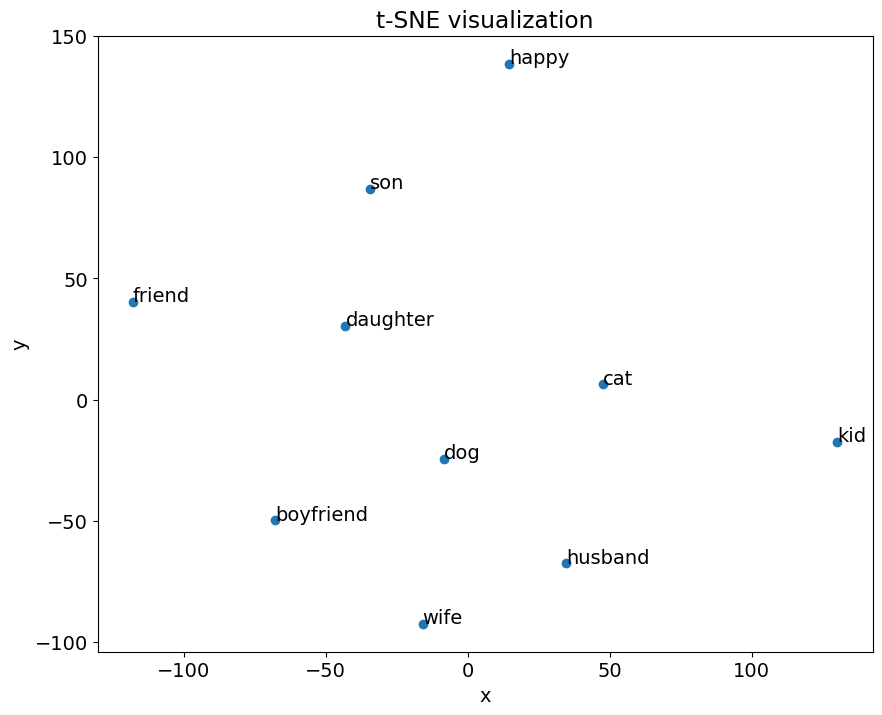

[-1.21623978e-01  2.35871240e-01  8.87436345e-02 -4.07081284e-03
 -3.17737125e-02 -4.31768060e-01  5.57809807e-02  5.66795588e-01
 -1.13885969e-01 -3.43163614e-04 -2.17464983e-01 -4.33696806e-01
 -1.80919573e-01  4.97990251e-02  2.57596448e-02 -2.29852125e-01
  5.29932566e-02 -3.76749128e-01 -7.92592298e-03 -5.63983142e-01
  1.30547598e-01  2.00601384e-01  2.47855604e-01 -7.71849826e-02
 -8.16153660e-02  1.03559040e-01 -2.62982219e-01 -1.00110315e-01
 -1.89614832e-01  3.50858606e-02  3.10555339e-01  4.52418812e-02
  6.29140288e-02 -9.47689787e-02 -1.78718373e-01  3.34158748e-01
 -1.25672653e-01 -2.77021497e-01 -2.43478775e-01 -5.05850017e-01
  1.11254044e-01 -4.76279885e-01 -2.12967083e-01 -1.09221470e-02
  2.07905158e-01 -2.50508845e-01 -2.12582082e-01 -2.28087027e-02
  6.20126277e-02  1.89567000e-01  1.19342856e-01 -2.93546736e-01
 -5.67729995e-02 -1.52981251e-01 -1.14142284e-01  1.55441314e-01
  1.79944098e-01 -3.52178924e-02 -2.74725735e-01  7.28415027e-02
  5.48953824e-02 -4.48261

In [33]:
##create t-SNE model##
tsne = TSNE(n_components=2, random_state=0,perplexity=6)
words_list1 = ['cat', 'happy', 'dog', 'kid', 'wife', 'husband', 'boyfriend', 'friend','son','daughter']
vectors = model.wv[words_list1]
transformed_vector = tsne.fit_transform(vectors)
plt.rcParams['font.sans-serif'] = "DejaVu Sans"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams['font.size'] = 14
plt.figure(figsize=(10, 8))
plt.scatter(transformed_vector[:,0], transformed_vector[:,1])
for i, word in enumerate(words_list1):
    plt.annotate(word, xy=(transformed_vector[i, 0], transformed_vector[i, 1]))
plt.title('t-SNE visualization')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

def document_vector(doc):
    return np.mean([model.wv[word] for word in doc if word in model.wv], axis=0)

##
print(document_vector(textList[0]))
X = np.array([document_vector(doc) for doc in textList])
print(X.shape)

I compressed the Word2Vec embeddings into a 2-dimensional scatter plot to illustrate the relationship between the word "cat" and other words such as "happy," "dog," "kid," "wife," "husband," "boyfriend," "friend," "son," and "daughter." The proximity of these words on the scatter plot reflects their similarity and relevance in the semantic space. Notably, "cat" is positioned closely to these other words, indicating a strong degree of relevance and similarity in their semantic associations.

In [5]:
##add demograph feature###

demographCol = ['gender', 'marital', 'parenthood']
df_demograph_feature = df[demographCol]

df_demograph_feature = pd.get_dummies(df_demograph_feature)
df["age"].fillna(0, inplace=True)
df["age"].replace(['prefer not to say', 'čá'], 0, inplace=True)

df_demograph_feature["age"] = df["age"]
df_demograph_feature["age"] = df_demograph_feature["age"].astype(float)

df_demograph_feature = df_demograph_feature.to_numpy()

X = np.hstack((X, df_demograph_feature))

y = df['ground_truth_category']

### Modeling

In [6]:
# Split the data into training/testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a classifier
classifier = RandomForestClassifier(n_estimators=100)
classifier.fit(X_train, y_train)

# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Random Forest Accuracy: {accuracy}')


##build xgboost model
labelDict = {
    "bonding" : 0,
    "leisure" : 1,
    "affection" : 2,
    "enjoy_the_moment" : 3,
    "achievement" : 4,
    "nature" : 5,
    "exercise" : 6
}


y_train = y_train.apply(lambda x: labelDict[x])
y_test = y_test.apply(lambda x: labelDict[x])


model = XGBClassifier()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
print('Xgboost Accuracy: ', accuracy_score(y_test, y_pred))


Random Forest Accuracy: 0.6673928830791576
Xgboost Accuracy:  0.6771968046477851


### Conclusion

In this study, we leveraged Natural Language Processing (NLP) techniques to analyze the HappyDB dataset, a collection of over 100,000 crowd-sourced happy moments, with the primary goal of gaining insights into the factors contributing to happiness as expressed in text. We applied data cleaning, transformation, visualization, word representation, and modeling techniques to achieve our research objectives.

Our modeling efforts, employing Random Forest and XGBoost algorithms, yielded promising results:

Random Forest Accuracy: We achieved an accuracy of approximately 66.74% with the Random Forest model, showcasing its capability to classify and analyze happiness-related text data effectively.

XGBoost Accuracy: Our XGBoost model demonstrated even higher accuracy, with an approximate accuracy rate of 67.72%. This suggests the robustness of XGBoost in handling text-based classification tasks related to happiness.

These accuracy rates, while not perfect, provide valuable insights into our understanding of happiness expressed in textual data. They indicate that NLP techniques can be successfully applied to analyze and categorize happy moments from the HappyDB dataset.

Our findings underscore the potential of NLP in uncovering the nuanced expressions of happiness and the factors that contribute to individuals' well-being. This research at the intersection of NLP and positive psychology offers a significant contribution to the growing body of knowledge in understanding human emotions and experiences.

However, it is important to note that the complexities of human emotions and the subjective nature of happiness make this an ongoing and evolving area of study. Future research may explore more advanced NLP techniques, larger datasets, and additional features to further improve accuracy and gain deeper insights into the intricate tapestry of happiness in language.

In conclusion, our analysis of HappyDB using NLP methods has provided valuable insights into the expression of happiness in text. These findings contribute to the broader understanding of happiness and offer potential applications in fields such as sentiment analysis, well-being assessment, and positive psychology research.

In line with my interest in cats, I've observed that cats consistently appear relatively small in word clouds, whether we apply data filtering or not. However, it's worth noting that cats exhibit strong relevance and similarity in the semantic space, as demonstrated by the 2-dimensional Word2Vec scatter plot.